# CycleGAN, Image-to-Image Translation (Summer <-> Winter)

Define and train a cycleGAN that maps a summer picture to winter and vice version. Using [Yosemite national park](https://en.wikipedia.org/wiki/Yosemite_National_Park) pictures taken either during the summer of winter 

<img src='notebook_images/XY_season_images.png' width=50% />

## Load and Visualize the Data

In [ ]:
# !unzip summer2winter_yosemite.zip

In [ ]:
# load in and transform data
import os
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

# visualize
import matplotlib.pyplot as plt
import numpy as np
import warnings

%matplotlib inline

### DataLoaders

In [ ]:
def get_data_loader(image_type, image_dir='summer2winter_yosemite', 
                    image_size=128, batch_size=16, num_workers=0):
    """
    Returns training and test data loaders for a given image type, either 'summer' or 'winter'. 
    These images will be resized to 128x128x3, by default, converted into Tensors, and normalized.
    """
    
    # resize and normalize the images
    transform = transforms.Compose([transforms.Resize(image_size), # resize to 128x128
                                    transforms.ToTensor()])

    # get training and test directories
    image_path = './' + image_dir
    train_path = os.path.join(image_path, image_type)
    test_path = os.path.join(image_path, 'test_{}'.format(image_type))

    # define datasets using ImageFolder
    train_dataset = datasets.ImageFolder(train_path, transform)
    test_dataset = datasets.ImageFolder(test_path, transform)

    # create and return DataLoaders
    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, test_loader

In [ ]:
# Create train and test dataloaders for images from the two domains X and Y
dataloader_X, test_dataloader_X = get_data_loader(image_type='summer')
dataloader_Y, test_dataloader_Y = get_data_loader(image_type='winter')
test_iter_X = iter(test_dataloader_X)

## Display some Training Images

In [ ]:
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))    

# get images from X
dataiter = iter(dataloader_X)
# "_" because no labels (unsupervised)
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12, 8))
imshow(torchvision.utils.make_grid(images))

Next, let's visualize a batch of images from set $Y$.

In [ ]:
# get images from Y
dataiter = iter(dataloader_Y)
images, _ = dataiter.next()

# show images
fig = plt.figure(figsize=(12,8))
imshow(torchvision.utils.make_grid(images))

### Pre-processing: scaling from -1 to 1

In [ ]:
def scale(x, feature_range=(-1, 1)):
    ''' scale an image from any range to -1 and 1
    '''
    
    # scale from 0-1 to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

## Define the Model

A CycleGAN has two discriminators and two generators in its network.

## Discriminators

<img src='notebook_images/discriminator_layers.png' width=80% />

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a convolutional layer, with optional batch normalization.
    """
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    layers.append(conv_layer)
    
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
        
    return nn.Sequential(*layers)

In [ ]:
class Discriminator(nn.Module):
    
    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()
        # convolutional layers
        self.conv1 = conv(3, conv_dim, 4, batch_norm = False)
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)
        self.conv4 = conv(conv_dim*4, conv_dim*8, 4)
        self.conv5 = conv(conv_dim*8, 1, 4, stride=1, batch_norm = False)

    def forward(self, x):
        # define feedforward behavior
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.conv5(x)
        return x

## Generators

<img src='notebook_images/cyclegan_generator_ex.png' width=90% />

In [ ]:
class ResidualBlock(nn.Module):
    """Defines a residual block.
       Adds an input x to a convolutional layer (applied to x) with the same size input and output.
    """
    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()        
        self.conv1 = conv(conv_dim, conv_dim, 3, 1, batch_norm = True)
        self.conv2 = conv(conv_dim, conv_dim, 3, 1, batch_norm = True)
        
    def forward(self, x):
        out = F.relu(self.conv1(x))
        out2 = F.relu(self.conv2(out)) + x
        return out2

### Transpose Convolutional Helper Function

In [ ]:
def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=True):
    """Creates a transpose convolutional layer, with optional batch normalization.
    """
    layers = []
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))

    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
        
    return nn.Sequential(*layers)

---
## Define the Generator Architecture

In [ ]:
class CycleGenerator(nn.Module):
    
    def __init__(self, conv_dim=64, n_res_blocks=6):
        super(CycleGenerator, self).__init__()

        # encoder
        self.conv1 = conv(3, conv_dim, 4)
        self.conv2 = conv(conv_dim, conv_dim*2, 4)
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4)
        
        # res layers
        res = []
        for layer in range(n_res_blocks):
            res.append(ResidualBlock(conv_dim*4))
        self.res_section = nn.Sequential(*res)
        
        # decoder
        self.deconv1 = deconv(conv_dim*4, conv_dim*2, 4)
        self.deconv2 = deconv(conv_dim*2, conv_dim, 4)
        self.deconv3 = deconv(conv_dim, 3, 4, batch_norm=False)

    def forward(self, x):
        """Given an image x, returns a transformed image."""
        
        # feedforward conv
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        
        # res layers
        x = self.res_section(x)
        
        # deconv and tanh at the end
        x = F.relu(self.deconv1(x))
        x = F.relu(self.deconv2(x))
        x = F.tanh(self.deconv3(x))
        return x

## Create the complete network

In [ ]:
def create_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):
    """Builds the generators and discriminators."""
    
    # Instantiate generators
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    # Instantiate discriminators
    D_X = Discriminator(conv_dim=d_conv_dim)
    D_Y = Discriminator(conv_dim=d_conv_dim)

    # move models to GPU
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [ ]:
G_XtoY, G_YtoX, D_X, D_Y = create_model()

## Check Model Architecture

In [ ]:
def print_models(G_XtoY, G_YtoX, D_X, D_Y):
    """Prints model information for the generators and discriminators.
    """
    print("                     G_XtoY                    ")
    print("-----------------------------------------------")
    print(G_XtoY)
    print()

    print("                     G_YtoX                    ")
    print("-----------------------------------------------")
    print(G_YtoX)
    print()

    print("                      D_X                      ")
    print("-----------------------------------------------")
    print(D_X)
    print()

    print("                      D_Y                      ")
    print("-----------------------------------------------")
    print(D_Y)
    print()
    
# print all of the models
print_models(G_XtoY, G_YtoX, D_X, D_Y)

## Cycle Consistency Losses

<img src='notebook_images/CycleGAN_loss.png' width=90% height=90% />

In addition to the adversarial losses, the generator loss terms will also include the cycle consistency loss. This loss is a measure of how good a reconstructed image is, when compared to an original image. 

### Define Loss Functions
Using parameters values from [CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf)

In [ ]:
def real_mse_loss(D_out):
    # how real is output
    return torch.mean((D_out-1)**2)    

def fake_mse_loss(D_out):
    # how fake is output
    return torch.mean(D_out**2)

def cycle_consistency_loss(real_im, reconstructed_im, lambda_weight):
    # calculate reconstruction loss 
    rec_loss = torch.mean(torch.abs(reconstructed_im - real_im))
    return lambda_weight * rec_loss

### Define the Optimizers
Using parameter values from [CycleGAN paper](https://arxiv.org/pdf/1703.10593.pdf)

In [ ]:
import torch.optim as optim

lr=0.002
beta1=0.5
beta2=0.999

g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())  # Get generator parameters

# Create optimizers
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

## Training a CycleGAN

**Training the Discriminators**
1. Compute the discriminator $D_X$ loss on real images
2. Generate fake images that look like domain $X$ based on real images in domain $Y$
3. Compute the fake loss for $D_X$
4. Compute the total loss and perform backpropagation and $D_X$ optimization
5. Repeat steps 1-4 only with $D_Y$ and domains switched!


**Training the Generators**
1. Generate fake images that look like domain $X$ based on real images in domain $Y$
2. Compute the generator loss based on how $D_X$ responds to fake $X$
3. Generate *reconstructed* $\hat{Y}$ images based on the fake $X$ images generated in step 1
4. Compute the cycle consistency loss by comparing the reconstructions with real $Y$ images
5. Repeat steps 1-4 only swapping domains
6. Add up all the generator and reconstruction losses and perform backpropagation + optimization

<img src='notebook_images/cycle_consistency_ex.png' width=70% />

In [ ]:
# import helper function
from helpers import save_samples, checkpoint

In [ ]:
# train the network
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, 
                  n_epochs=1000):
    
    print_every=10
    
    # graph losses
    losses = []
    
    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)

    # Get some fixed data from domains X and Y for sampling
    fixed_X = test_iter_X.next()[0]
    fixed_Y = test_iter_Y.next()[0]
    fixed_X = scale(fixed_X)
    fixed_Y = scale(fixed_Y)

    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    for epoch in range(1, n_epochs+1):

        # Reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        images_X, _ = iter_X.next()
        images_X = scale(images_X)
        images_Y, _ = iter_Y.next()
        images_Y = scale(images_Y)
        
        # GPU
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)


        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================

        # D_X real and fake loss
        d_x_optimizer.zero_grad()

        out_x = D_X(images_X)
        D_X_real_loss = real_mse_loss(out_x)
        
        fake_X = G_YtoX(images_Y)
        out_x = D_X(fake_X)
        D_X_fake_loss = fake_mse_loss(out_x)

        d_x_loss = D_X_real_loss + D_X_fake_loss
        d_x_loss.backward()
        d_x_optimizer.step()

        # D_Y real and fake loss
        d_y_optimizer.zero_grad()
        
        out_y = D_Y(images_Y)
        D_Y_real_loss = real_mse_loss(out_y)
        
        fake_Y = G_XtoY(images_X)
        out_y = D_Y(fake_Y)
        D_Y_fake_loss = fake_mse_loss(out_y)

        d_y_loss = D_Y_real_loss + D_Y_fake_loss
        d_y_loss.backward()
        d_y_optimizer.step()


        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================

        # generate X and reconstruct Y
        g_optimizer.zero_grad()

        fake_X = G_YtoX(images_Y)
        out_x = D_X(fake_X)
        g_YtoX_loss = real_mse_loss(out_x)

        reconstructed_Y = G_XtoY(fake_X)
        reconstructed_y_loss = cycle_consistency_loss(images_Y, reconstructed_Y, lambda_weight=10)

        # generate Y and reconstruct X
        fake_Y = G_XtoY(images_X)
        out_y = D_Y(fake_Y)
        g_XtoY_loss = real_mse_loss(out_y)

        reconstructed_X = G_YtoX(fake_Y)
        reconstructed_x_loss = cycle_consistency_loss(images_X, reconstructed_X, lambda_weight=10)

        # add up all losses
        g_total_loss = g_YtoX_loss + g_XtoY_loss + reconstructed_y_loss + reconstructed_x_loss
        g_total_loss.backward()
        g_optimizer.step()

        # Print stats of losses
        if epoch % print_every == 0:
            losses.append((d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))
            print('Epoch [{:5d}/{:5d}] | d_X_loss: {:6.4f} | d_Y_loss: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    epoch, n_epochs, d_x_loss.item(), d_y_loss.item(), g_total_loss.item()))

            
        sample_every=100
        # Save samples
        if epoch % sample_every == 0:
            G_YtoX.eval()
            G_XtoY.eval()
            save_samples(epoch, fixed_Y, fixed_X, G_YtoX, G_XtoY, batch_size=16)
            G_YtoX.train()
            G_XtoY.train()

        checkpoint_every=1000
        # Save model parameters
        if epoch % checkpoint_every == 0:
            checkpoint(epoch, G_XtoY, G_YtoX, D_X, D_Y)

    return losses

In [ ]:
n_epochs = 5000

losses = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=n_epochs)

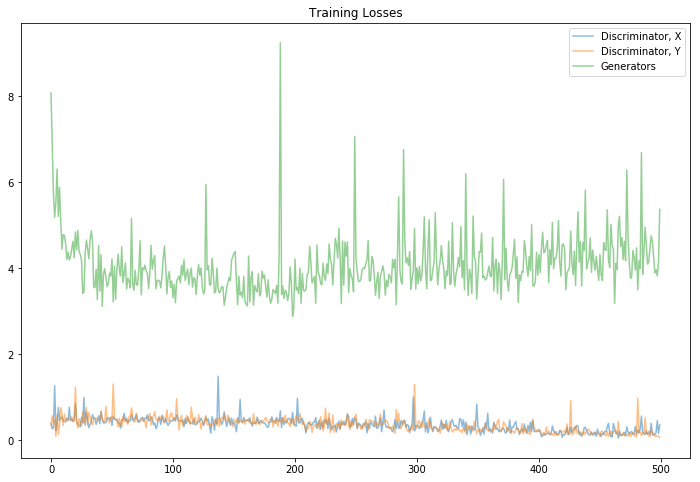

In [26]:
# plot training losses of both discriminators and both generators
fig, ax = plt.subplots(figsize=(12,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator, X', alpha=0.5)
plt.plot(losses.T[1], label='Discriminator, Y', alpha=0.5)
plt.plot(losses.T[2], label='Generators', alpha=0.5)
plt.title("Training Losses") 
plt.legend() 

## Peak the Result

In [33]:
import matplotlib.image as mpimg

# helper visualization
def view_samples(iteration, sample_dir='samples_cyclegan'):
    
    path_XtoY = os.path.join(sample_dir, 'sample-{:06d}-X-Y.png'.format(iteration))
    path_YtoX = os.path.join(sample_dir, 'sample-{:06d}-Y-X.png'.format(iteration))
    
    # read in samples
    try: 
        x2y = mpimg.imread(path_XtoY)
        y2x = mpimg.imread(path_YtoX)
    except:
        print('Invalid number of iterations.')
    
    fig, (ax1, ax2) = plt.subplots(figsize=(18,20), nrows=2, ncols=1, sharey=True, sharex=True)
    ax1.imshow(x2y)
    ax1.set_title('Summer to Winter')
    ax2.imshow(y2x)
    ax2.set_title('Winter to Summer')

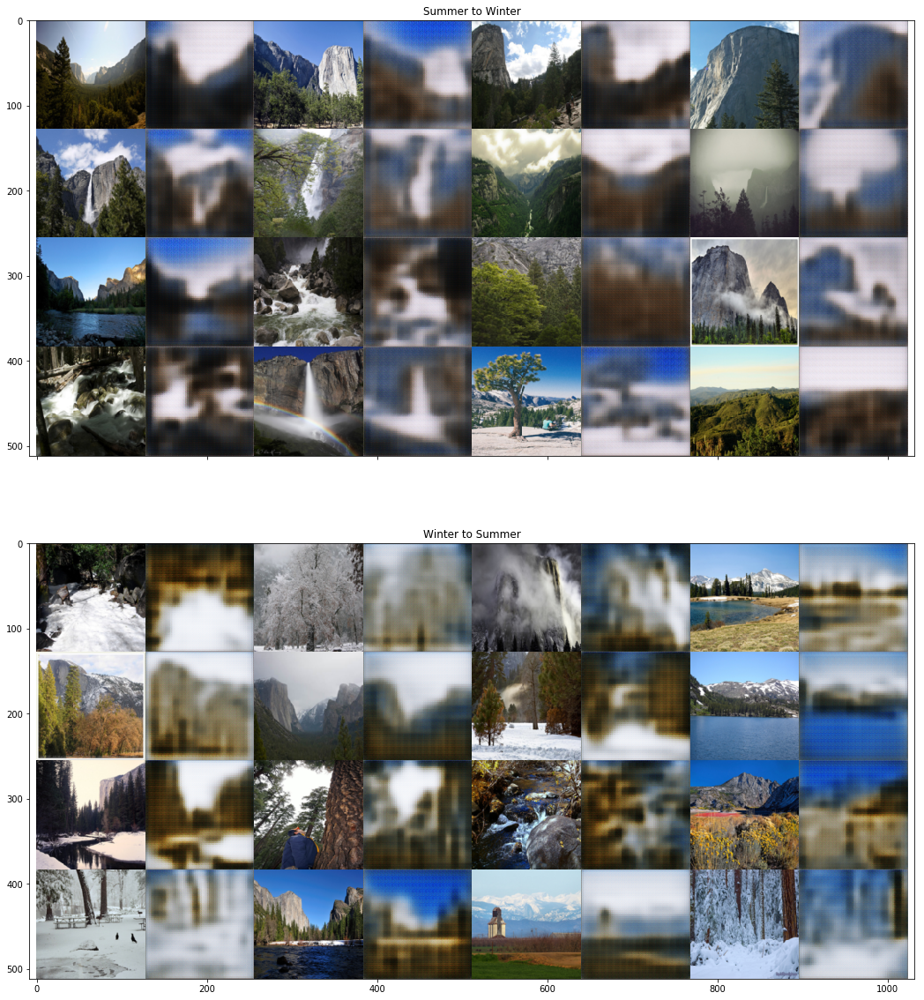

In [34]:
# view samples at iteration 100
view_samples(100, 'samples_cyclegan')

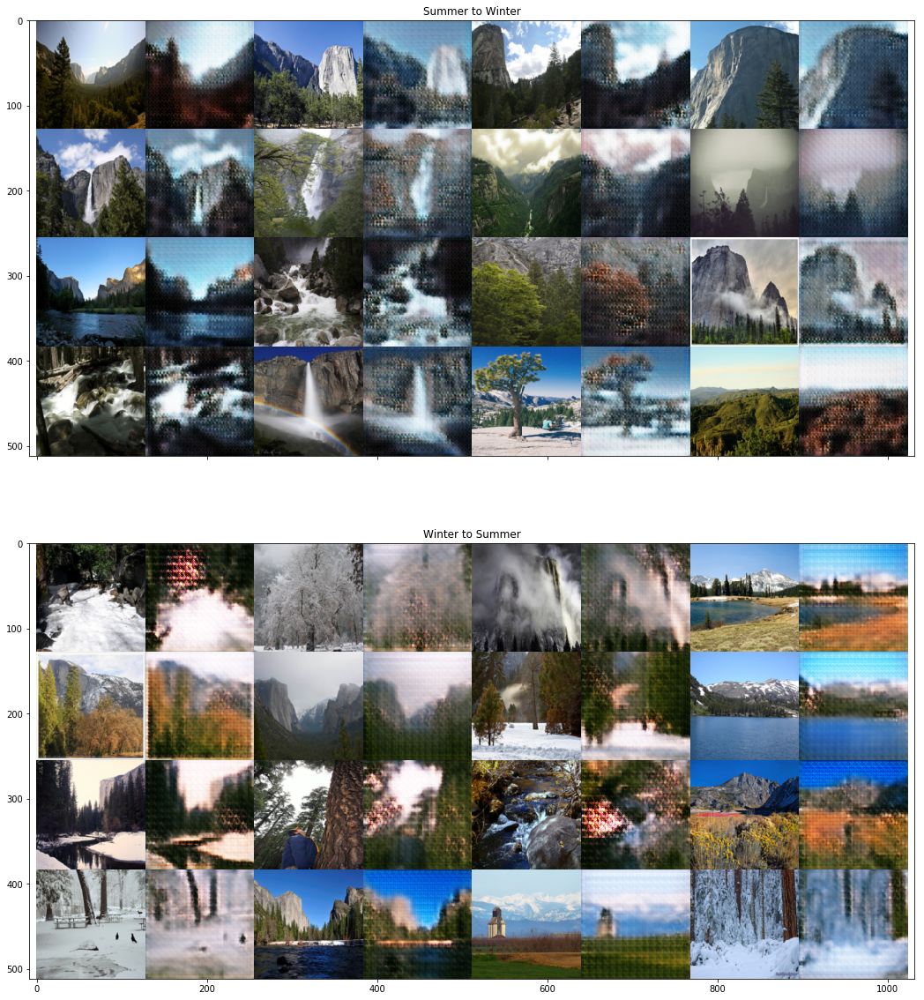

In [35]:
# view samples at iteration 1000
view_samples(1000, 'samples_cyclegan')

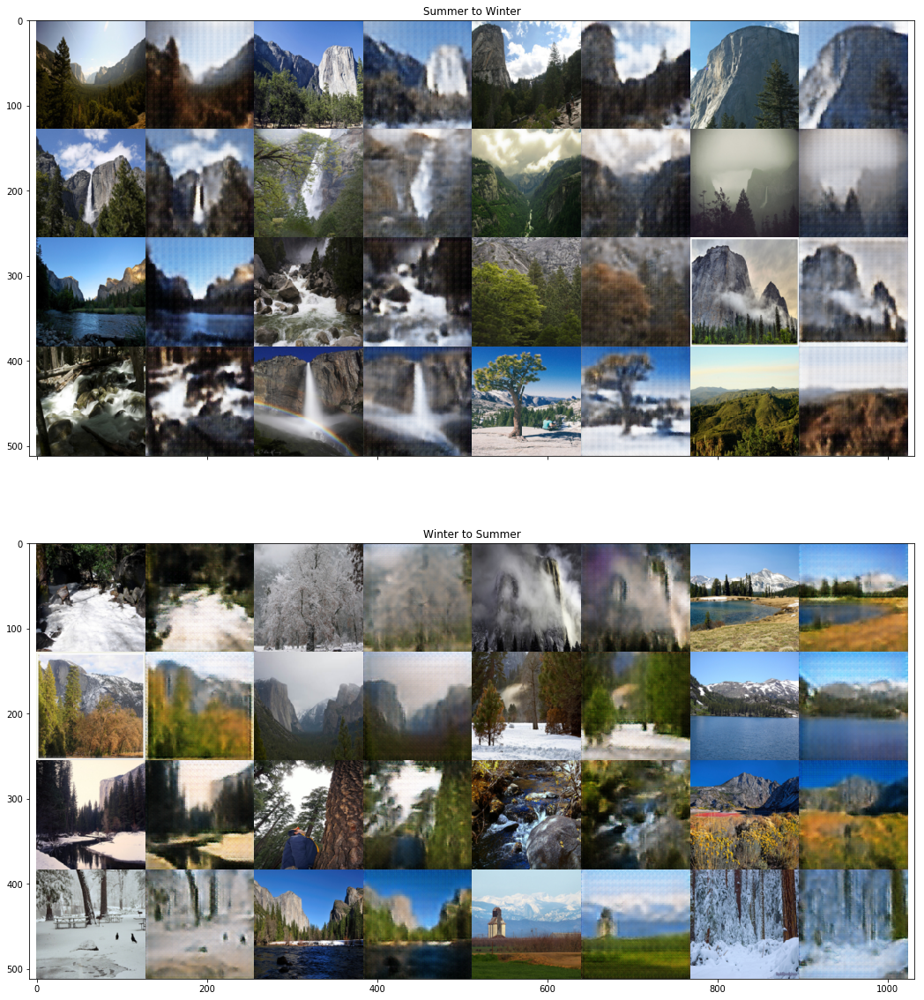

In [36]:
# view samples at iteration 1000
view_samples(2000, 'samples_cyclegan')

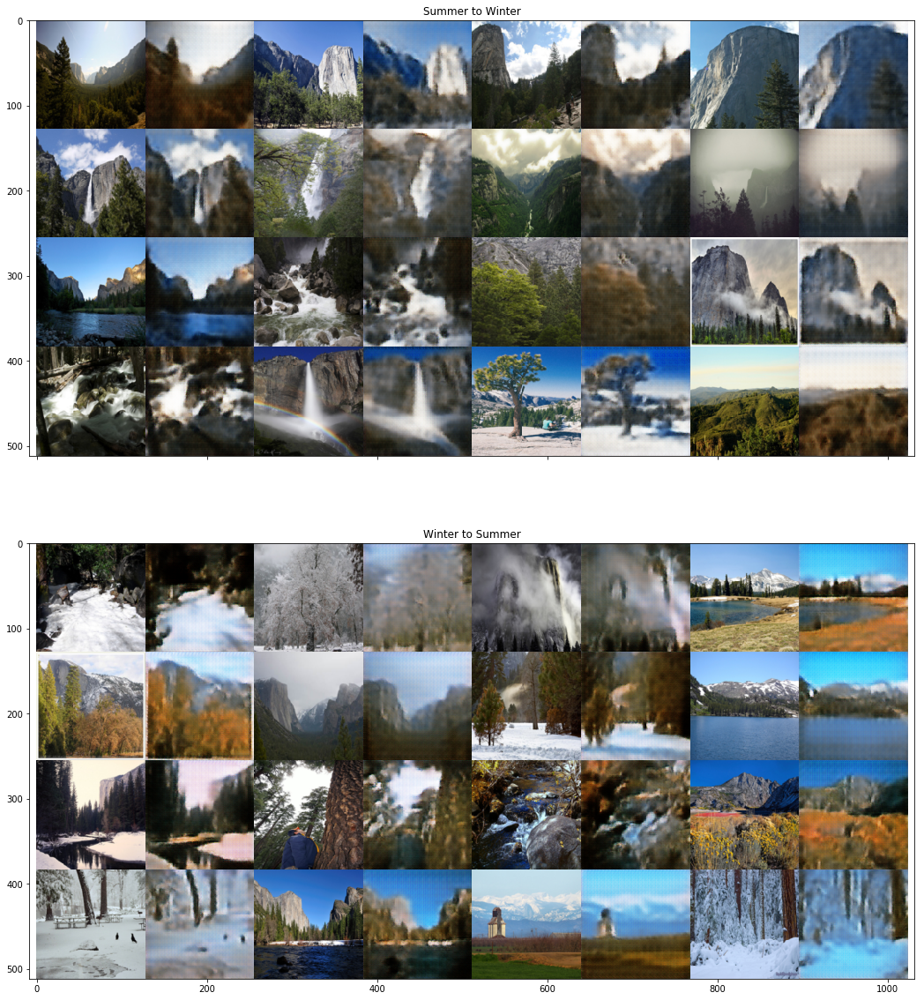

In [37]:
# view samples at iteration 1000
view_samples(3000, 'samples_cyclegan')

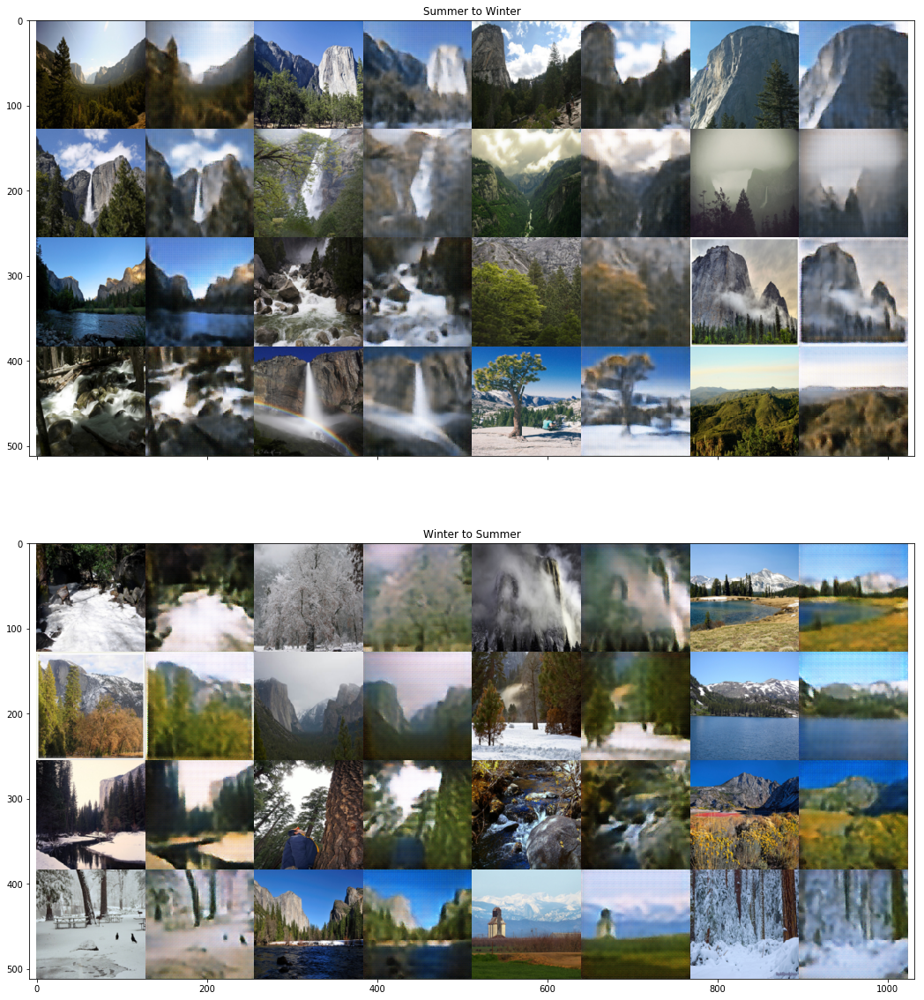

In [38]:
# view samples at iteration 1000
view_samples(4000, 'samples_cyclegan')

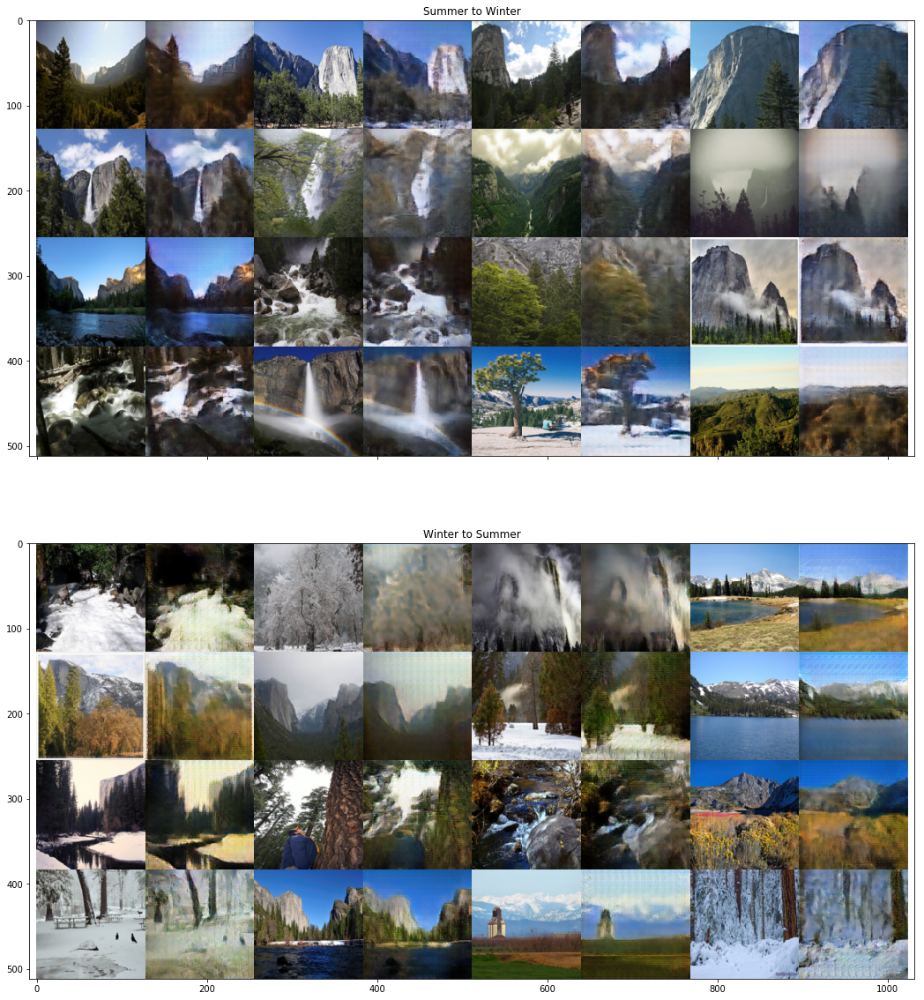

In [39]:
# view samples at iteration 1000
view_samples(5000, 'samples_cyclegan')